# Differential Kinetic Testing

This notebook is for conducting differential kinetic testing for clusters in autoencoder embeddings

### Data Preprocessing

In [1]:
import scvelo as scv
import scanpy as sc
import numpy as np
import sklearn
scv.set_figure_params()

In [2]:
adata = scv.datasets.pancreas()
adata_raw = adata.copy()

In [3]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.filter_and_normalize(adata_raw, log=False, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

Filtered out 20801 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
Filtered out 20801 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
computing neighbors
    finished (0:00:04) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


recovering dynamics (using 2/28 cores)
or disable the progress bar using `show_progress_bar=False`.
    finished (0:04:34) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:04) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 2/28 cores)
    finished (0:00:14) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


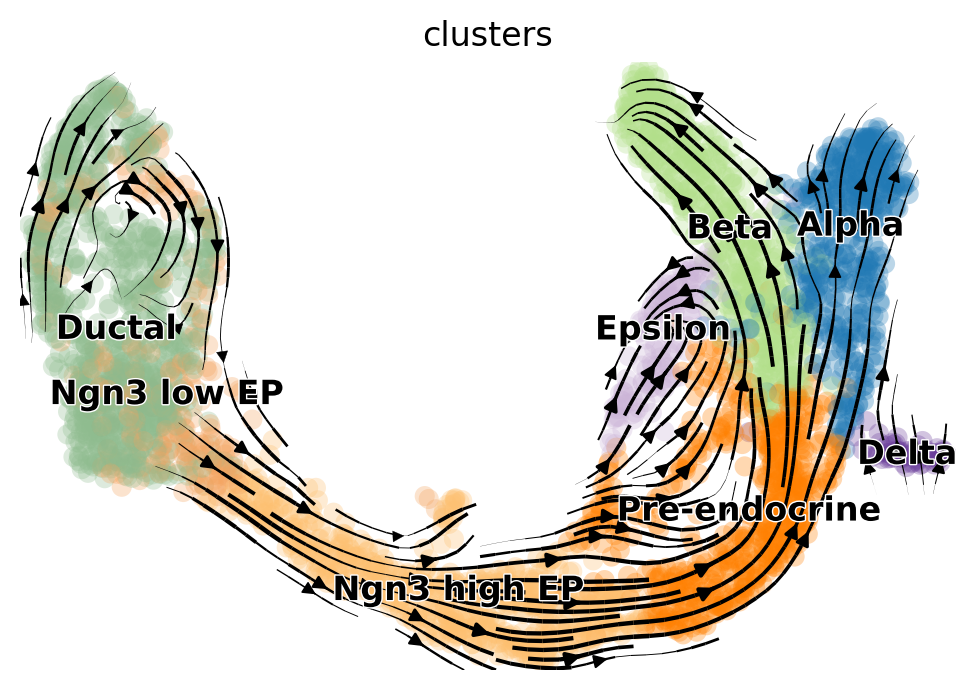

computing terminal states
    identified 2 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


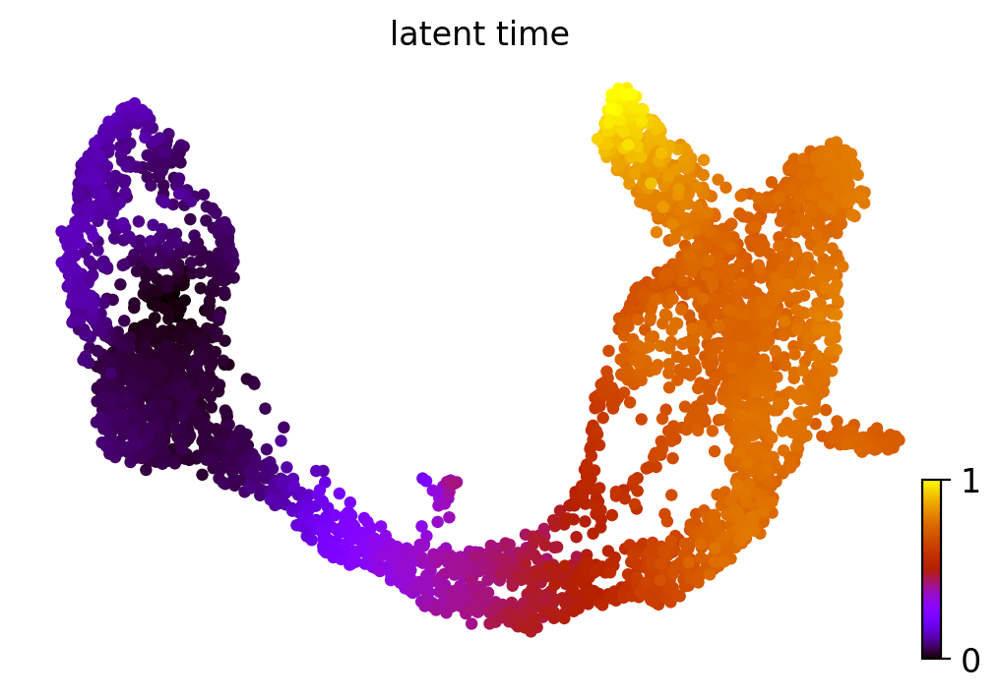

In [4]:
# Extract dynamical velocity vectors
scv.tl.recover_dynamics(adata, n_jobs=2)
scv.tl.velocity(adata, mode='dynamical', use_raw=True)
scv.tl.velocity_graph(adata, n_jobs=2)
scv.pl.velocity_embedding_stream(adata, basis='umap')

# Latent time inference
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80)

In [13]:
X = np.tile(adata_raw.X.A[:, adata.var["velocity_genes"]], (6, 1))
Y = np.tile(adata.layers["velocity"][:, adata.var["velocity_genes"]], (6, 1))
noise_sigma = (adata_raw.X.A.std()/65)**2
X[adata_raw.shape[0]:, :] += \
    np.random.normal(0, noise_sigma, X[adata_raw.shape[0]:, :].shape)

X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(X, 
                                                    Y, 
                                                    test_size=0.1, 
                                                    random_state=42)

# we see that noise has been added to denoise the autoencoder
print(X[:100])
print(X[adata_raw.shape[0]:(adata_raw.shape[0]+100), :])

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.8759722 0.        0.        ... 1.7519444 0.        0.       ]
 [0.        0.        0.        ... 0.        1.5218673 0.       ]
 ...
 [0.        0.        0.        ... 1.3494554 0.        0.       ]
 [0.5701924 0.5701924 0.        ... 4.561539  0.        0.       ]
 [0.        0.        0.        ... 0.9822391 0.        0.       ]]
[[ 9.4557581e-03  1.7528094e-03  3.2394580e-03 ... -3.8651347e-03
   1.5590893e-03  1.2009421e-02]
 [ 8.8084292e-01 -1.4247873e-02 -2.9915783e-03 ...  1.7508234e+00
   1.5473848e-02 -4.9018119e-03]
 [ 1.9355306e-02 -4.5335037e-03  2.2705620e-02 ... -9.5244832e-03
   1.5186625e+00  2.0865517e-04]
 ...
 [ 2.3816274e-03  7.0677404e-03 -1.1123282e-02 ...  1.3513292e+00
   4.3087378e-03 -4.2361426e-03]
 [ 5.6191546e-01  5.6154954e-01  7.2046695e-03 ...  4.5678720e+00
   9.5978600e-04  2.7006313e-03]
 [ 6.6086696e-03  7.8656292e-03 -1.0171115e-02 ...  9.8218554e-01
  -1.4532105e-03 -6.867617

### Model Training

In [14]:
from tensorflow import keras
from tensorflow.keras import layers
import sklearn
import numpy as np
import tensorflow as tf

tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [15]:
input_dim = keras.Input(shape=(X.shape[1],))
encoded = layers.Dense(64, kernel_regularizer=keras.regularizers.l1(1e-6))(input_dim)
encoded = layers.Dense(16, kernel_regularizer=keras.regularizers.l1(1e-2))(encoded)

decoded = layers.Dense(16, kernel_regularizer=keras.regularizers.l1(1e-4))(encoded)
decoded = layers.Dense(64, kernel_regularizer=keras.regularizers.l1(1e-6))(decoded)
decoded = layers.Dense(Y.shape[1])(decoded)

# This model maps an input to its reconstruction
encoder = keras.Model(input_dim, encoded)
autoencoder = keras.Model(input_dim, decoded)

opt = keras.optimizers.Adam(learning_rate=0.00005)
autoencoder.compile(optimizer=opt, loss='mse')
autoencoder.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 1027)]            0         
_________________________________________________________________
dense_5 (Dense)              (None, 64)                65792     
_________________________________________________________________
dense_6 (Dense)              (None, 16)                1040      
_________________________________________________________________
dense_7 (Dense)              (None, 16)                272       
_________________________________________________________________
dense_8 (Dense)              (None, 64)                1088      
_________________________________________________________________
dense_9 (Dense)              (None, 1027)              66755     
Total params: 134,947
Trainable params: 134,947
Non-trainable params: 0
_____________________________________________________

In [16]:
es = keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)
autoencoder.fit(X_train, y_train,
        epochs=100,
        batch_size=2,
        shuffle=True,
        validation_data=(X_test, y_test),
        callbacks=[es])

Epoch 1/100
9979/9979 [==============================] - 17s 2ms/step - loss: 0.6033 - val_loss: 0.0532
Epoch 2/100
9979/9979 [==============================] - 16s 2ms/step - loss: 0.0433 - val_loss: 0.0379
Epoch 3/100
9979/9979 [==============================] - 17s 2ms/step - loss: 0.0360 - val_loss: 0.0348
Epoch 4/100
9979/9979 [==============================] - 17s 2ms/step - loss: 0.0341 - val_loss: 0.0337
Epoch 5/100
9979/9979 [==============================] - 17s 2ms/step - loss: 0.0333 - val_loss: 0.0331
Epoch 6/100
9979/9979 [==============================] - 16s 2ms/step - loss: 0.0327 - val_loss: 0.0326
Epoch 7/100
9979/9979 [==============================] - 17s 2ms/step - loss: 0.0322 - val_loss: 0.0322
Epoch 8/100
9979/9979 [==============================] - 17s 2ms/step - loss: 0.0319 - val_loss: 0.0319
Epoch 9/100
9979/9979 [==============================] - 16s 2ms/step - loss: 0.0316 - val_loss: 0.0316
Epoch 10/100
9979/9979 [==============================] - 17s 2m

### UMAP Projections

In [17]:
from scipy.integrate import odeint, solve_ivp
import umap
import matplotlib.pyplot as plt

In [117]:
pca = sklearn.decomposition.PCA(n_components=30)
adata_pca = pca.fit_transform(np.log1p(adata_raw.X.A[:, adata.var["velocity_genes"]]))
umap_reducer = umap.UMAP(random_state=42)
adata_umap = umap_reducer.fit_transform(adata_pca)
neigh = sklearn.neighbors.NearestNeighbors(n_neighbors=30)
neigh.fit(adata_pca)

NearestNeighbors(n_neighbors=30)

In [118]:
# ODE Solver Function
def raw_ae(t, in_x):
    input_x = tf.convert_to_tensor(np.expand_dims(in_x, axis=0))
    dx = autoencoder.predict(input_x).flatten() * 0.6
    return dx

# Interpolate over time
def interpolate(y0, neigh=neigh, pca=pca, umap_reducer=umap_reducer, steps=40, intermediate_steps=5):
    
    solution = []
    for step in range(steps):
        
        # Interpolate using autoencoder
        t_eval = list(range(intermediate_steps))
        #noise = np.random.normal(0, np.sqrt(adata.var["fit_variance"][adata.var["velocity_genes"]]), 
        #                          y0.shape[0])
        sol = solve_ivp(raw_ae, [0,max(t_eval)], y0, method="DOP853", t_eval=t_eval)
        y = sol.y.T
        
        # Lower dimensionality
        ending_pt_pca = pca.transform(np.nan_to_num(np.log1p(y)))
        ending_pt = umap_reducer.transform(ending_pt_pca)
        
        # Find knn reference points
        interp_neigh = neigh.kneighbors(ending_pt_pca)
        
        # New reference point
        y0 = np.median(X[interp_neigh[1][-1, :], :], axis=0)
        solution.append(y0)
        
        # Plot UMAP directions
        plt.figure(figsize=(10,3))
        plt.subplot(1, 3, 1)
        plt.scatter(adata_umap[:, 0], adata_umap[:, 1], 
                    s=1, alpha=0.5,
                    c=adata.uns["clusters_colors"][adata.obs.clusters.cat.codes.to_numpy()])
        plt.scatter(ending_pt[:, 0], 
                    ending_pt[:, 1], 
                    c=np.arange(ending_pt.shape[0]), 
                    cmap="viridis",
                    s=20
                   )
        plt.colorbar()
        plt.scatter(ending_pt[0, 0], ending_pt[0, 1], s=20, color="red")
        plt.gca().set_aspect('equal', 'datalim')
        
        # Plot PCA directions
        plt.subplot(1, 3, 2)
        plt.scatter(adata_pca[:, 0], 
                    adata_pca[:, 1], 
                    s=1, 
                    alpha=0.5, 
                    c=adata.uns["clusters_colors"][adata.obs.clusters.cat.codes.to_numpy()])
        plt.scatter(ending_pt_pca[:, 0], 
                    ending_pt_pca[:, 1], 
                    c=np.arange(ending_pt.shape[0]), 
                    cmap="viridis",
                    s=20
                   )
        plt.colorbar()
        plt.scatter(ending_pt_pca[0, 0], ending_pt_pca[0, 1], 
                    s=20, color="red")
        plt.gca().set_aspect('equal', 'datalim')

        plt.subplot(1, 3, 3)
        plt.scatter(adata_pca[:, 1], 
                    adata_pca[:, 2], 
                    s=1, 
                    alpha=0.5, c=adata.uns["clusters_colors"][adata.obs.clusters.cat.codes.to_numpy()])
        plt.scatter(ending_pt_pca[:, 1], 
                    ending_pt_pca[:, 2], 
                    c=np.arange(ending_pt.shape[0]), 
                    cmap="viridis",
                    s=20
                   )
        plt.colorbar()
        plt.scatter(ending_pt_pca[0, 1], ending_pt_pca[0, 2], 
                    s=20, color="red")
        plt.gca().set_aspect('equal', 'datalim')
        plt.show()
    
    return np.array(solution)

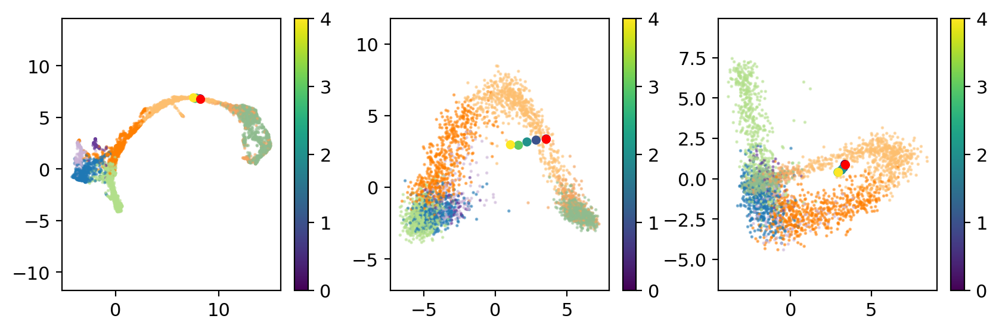

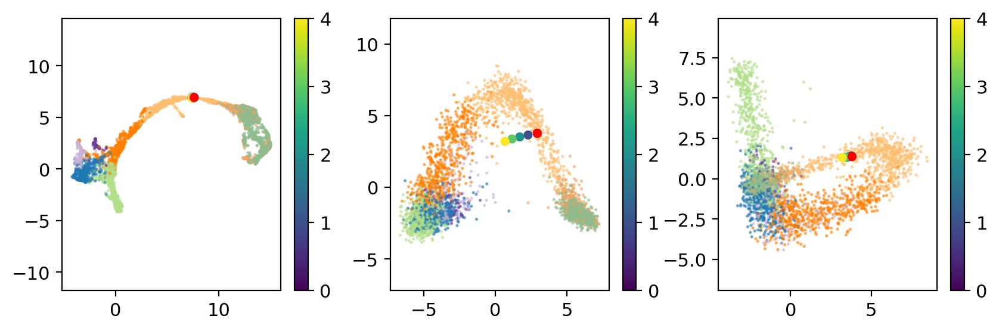

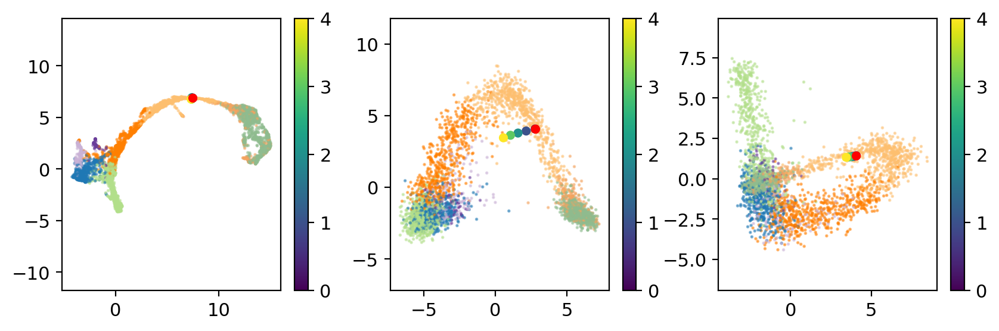

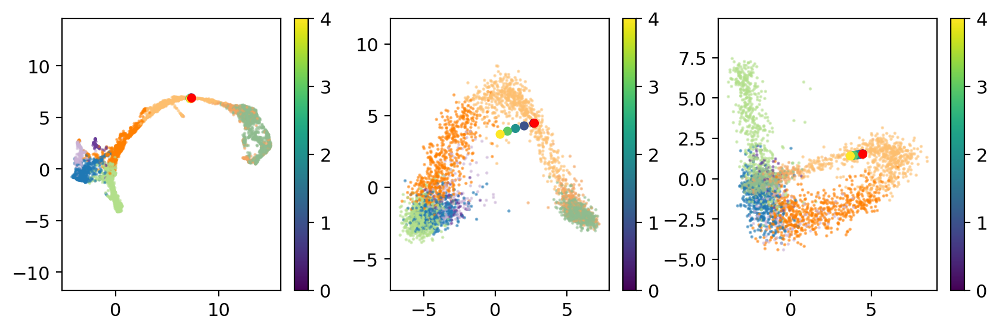

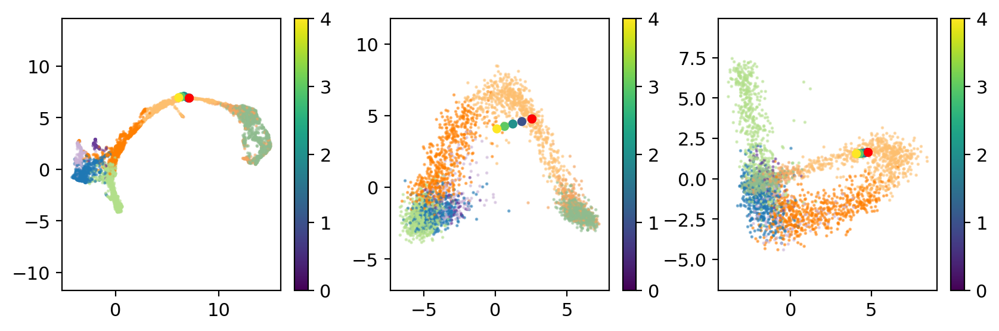

...

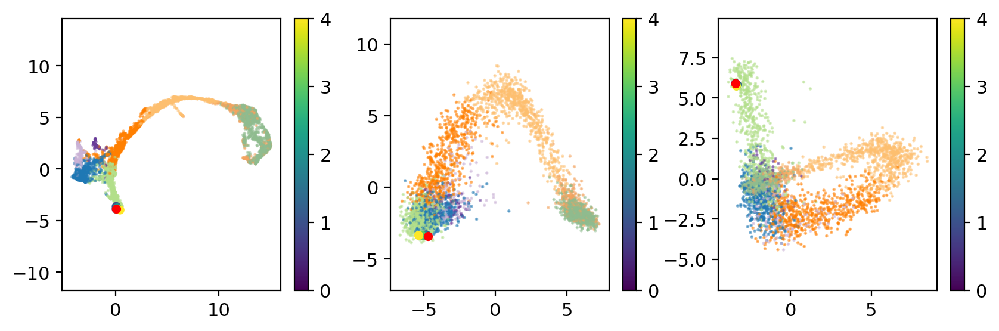

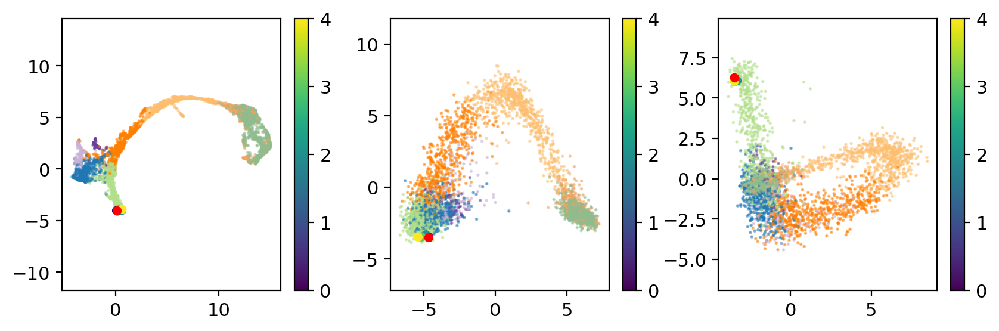

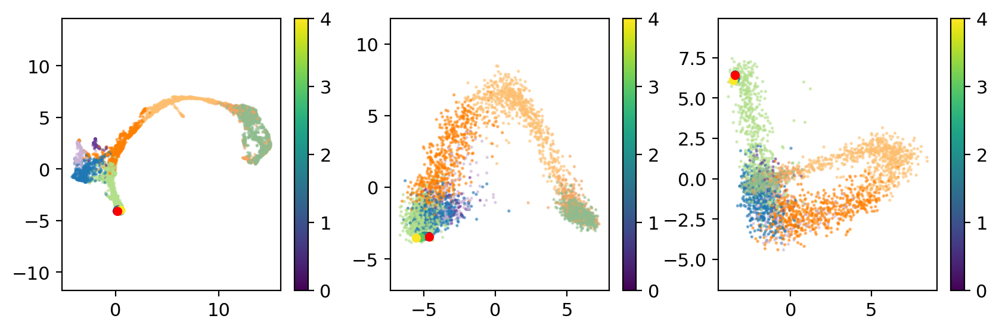

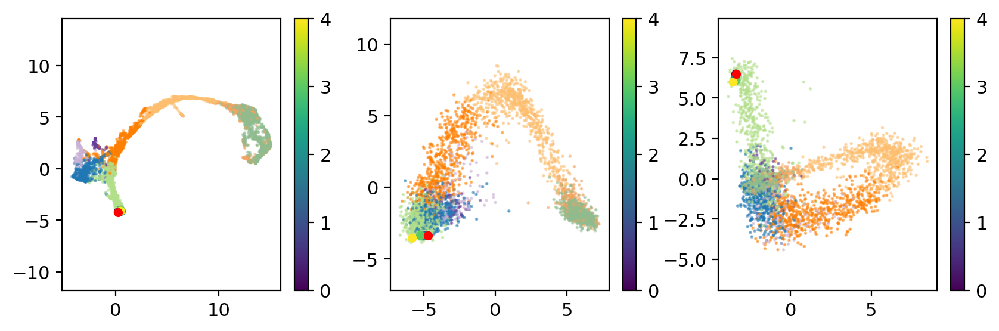

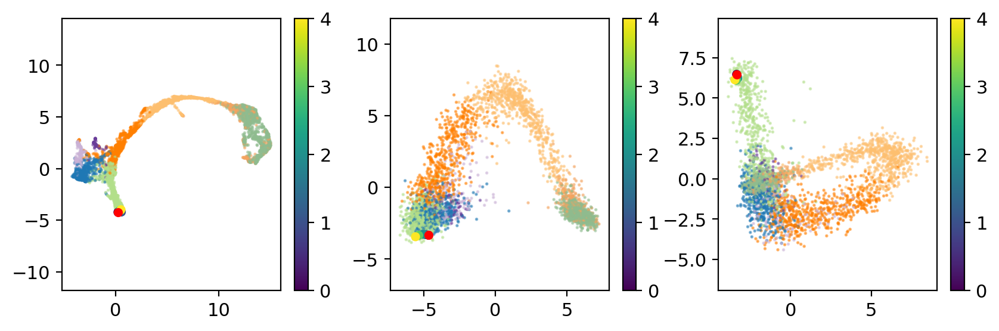

In [127]:
y0 = X[adata_raw.shape[0] + np.where(adata.obs.clusters == "Ngn3 high EP")[0][32], :] 
y_solution = interpolate(y0, 
                         neigh = neigh, 
                         pca = pca, 
                         umap_reducer = umap_reducer, steps=35)

### Manifold Visualizations

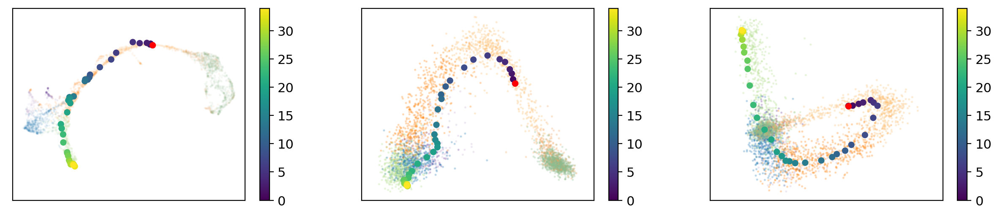

In [128]:
# Lower dimensionality
ending_pt_pca = pca.transform(np.nan_to_num(np.log1p(y_solution)))
ending_pt = umap_reducer.transform(ending_pt_pca)
        
# Plot UMAP directions
plt.figure(figsize=(15,3))
plt.subplot(1, 3, 1)
plt.scatter(adata_umap[:, 0], adata_umap[:, 1], 
            s=1, alpha=0.05,
            c=adata.uns["clusters_colors"][adata.obs.clusters.cat.codes.to_numpy()])
plt.scatter(ending_pt[:, 0], 
            ending_pt[:, 1], 
            c=np.arange(ending_pt.shape[0]), 
            cmap="viridis",
            s=20
           )
plt.colorbar()
plt.scatter(ending_pt[0, 0], ending_pt[0, 1], s=20, color="red")
plt.gca().set_aspect('equal', 'datalim')
plt.xticks([]),plt.yticks([])

# Plot PCA directions
plt.subplot(1, 3, 2)
plt.scatter(adata_pca[:, 0], 
            adata_pca[:, 1], 
            s=1, 
            alpha=0.2, 
            c=adata.uns["clusters_colors"][adata.obs.clusters.cat.codes.to_numpy()])
plt.scatter(ending_pt_pca[:, 0], 
            ending_pt_pca[:, 1], 
            c=np.arange(ending_pt.shape[0]), 
            cmap="viridis",
            s=20
           )
plt.colorbar()
plt.scatter(ending_pt_pca[0, 0], ending_pt_pca[0, 1], 
            s=20, color="red")
plt.gca().set_aspect('equal', 'datalim')
plt.xticks([]),plt.yticks([])

plt.subplot(1, 3, 3)
plt.scatter(adata_pca[:, 1], 
            adata_pca[:, 2], 
            s=1, 
            alpha=0.2, c=adata.uns["clusters_colors"][adata.obs.clusters.cat.codes.to_numpy()])
plt.scatter(ending_pt_pca[:, 1], 
            ending_pt_pca[:, 2], 
            c=np.arange(ending_pt.shape[0]), 
            cmap="viridis",
            s=20
           )
plt.colorbar()
plt.scatter(ending_pt_pca[0, 1], ending_pt_pca[0, 2], 
            s=20, color="red")
plt.gca().set_aspect('equal', 'datalim')
plt.xticks([]),plt.yticks([])
plt.savefig("one-sample-trajectory.pdf")
plt.show()

figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_new-velocity.png


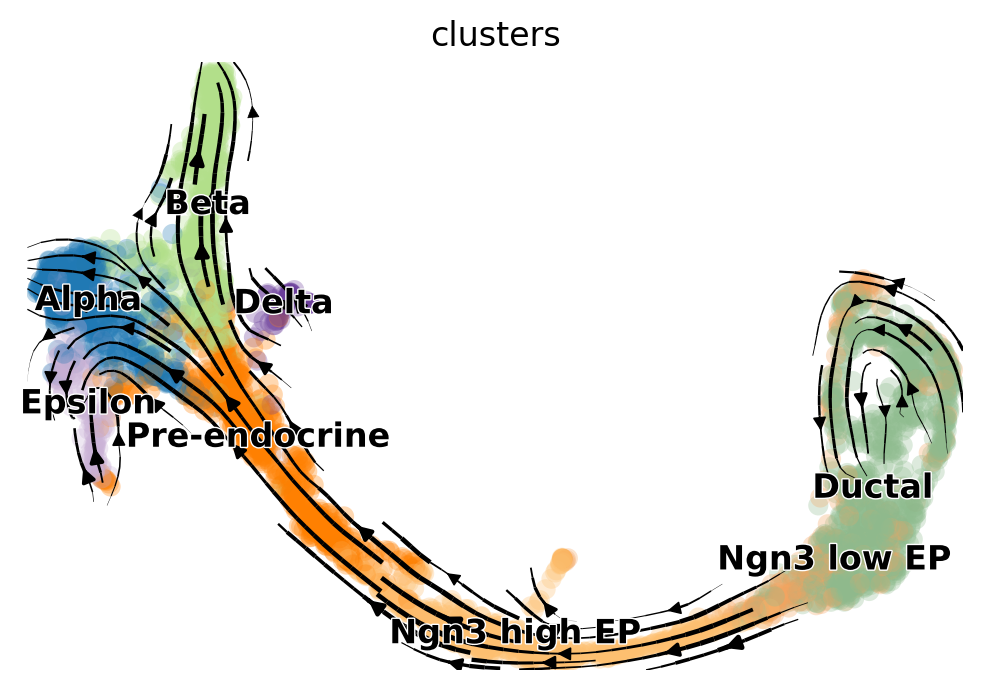

In [60]:
adata.obsm["new_umap"] = adata_umap
scv.pl.velocity_embedding_stream(adata, basis='new_umap', save="new-velocity")

### Embedding Visualizations

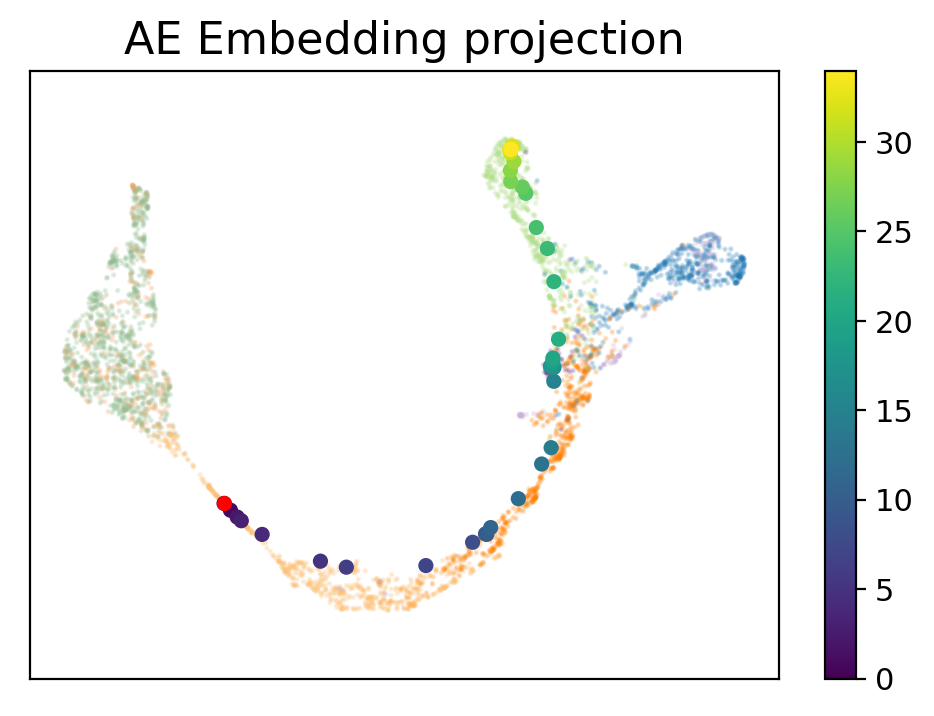

In [131]:
vae_embedding = encoder.predict(adata_raw.X.A[:, adata.var["velocity_genes"]])
vae_embedding_progress = encoder.predict(y_solution)

vae_reducer = umap.UMAP(random_state=42)
vae_embedding_umap = vae_reducer.fit_transform(vae_embedding)
vae_embedding_progress_umap = vae_reducer.transform(vae_embedding_progress)

plt.figure()
plt.scatter(vae_embedding_umap[:, 0], 
            vae_embedding_umap[:, 1], 
            c=adata.uns["clusters_colors"][adata.obs.clusters.cat.codes.to_numpy()],
            s=1, 
            alpha=0.2)
plt.scatter(vae_embedding_progress_umap[:, 0], 
            vae_embedding_progress_umap[:, 1], 
            c=np.arange(vae_embedding_progress_umap.shape[0]), 
            cmap="viridis",
            s=20
           )
plt.colorbar()
plt.scatter(vae_embedding_progress_umap[0, 0], vae_embedding_progress_umap[0, 1], s=20, color="red")
plt.gca().set_aspect('equal', 'datalim')
plt.title('AE Embedding projection', fontsize=16)
plt.xticks([]),plt.yticks([])
plt.savefig("ae-embedding-trajectory.pdf")
plt.show()

### Embedding Clustering and Differential Testing

In [30]:
adata

AnnData object with n_obs × n_vars = 3696 × 2000
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'highly_variable_genes', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca', 'recover_dynamics', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'loss'
    layers: 'spliced', 'unspliced', 'Ms', 'Mu', 'fit_t', 'fit_tau', 'fit_tau_', 'velocity', 'velocity_u'
    obsp: 'distances'

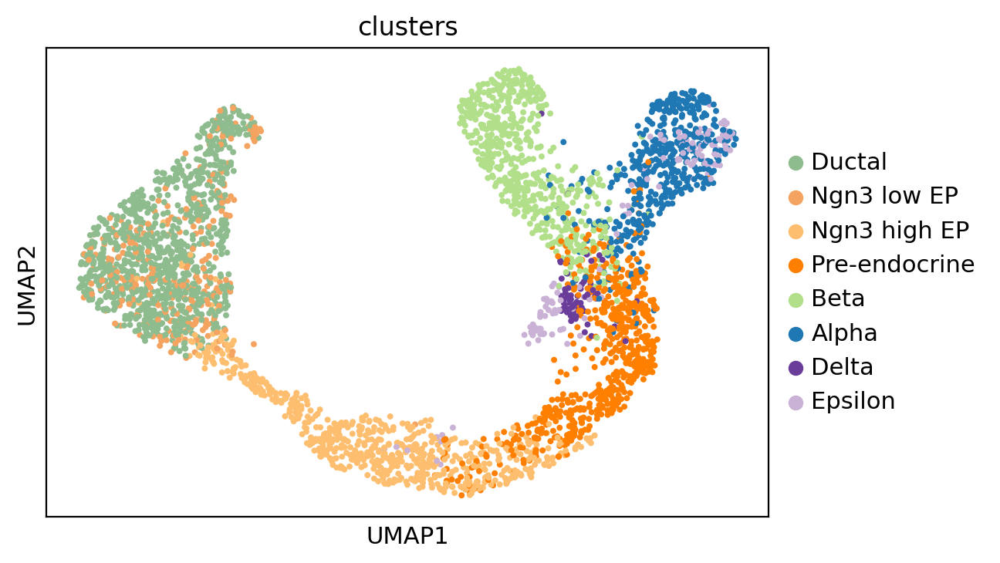

In [31]:
adata.obsm["X_vae_embedding"] = vae_embedding
sc.pp.neighbors(adata, n_neighbors=30, use_rep="X_vae_embedding")
sc.tl.umap(adata)
sc.pl.umap(adata, color=['clusters'])

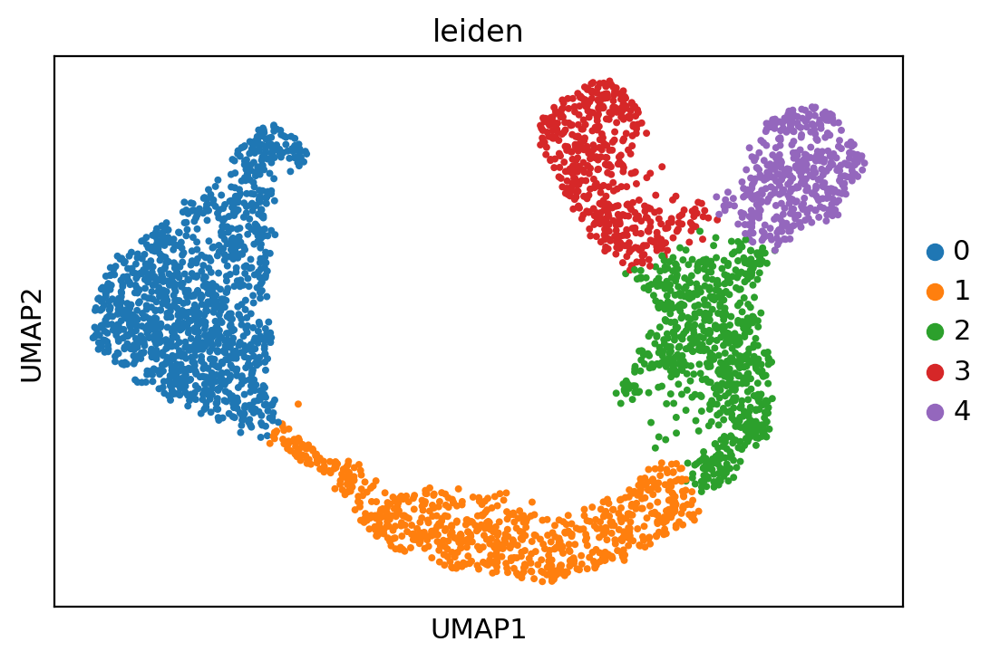

In [35]:
sc.tl.leiden(adata, resolution=0.14)
sc.pl.umap(adata, color=['leiden'])

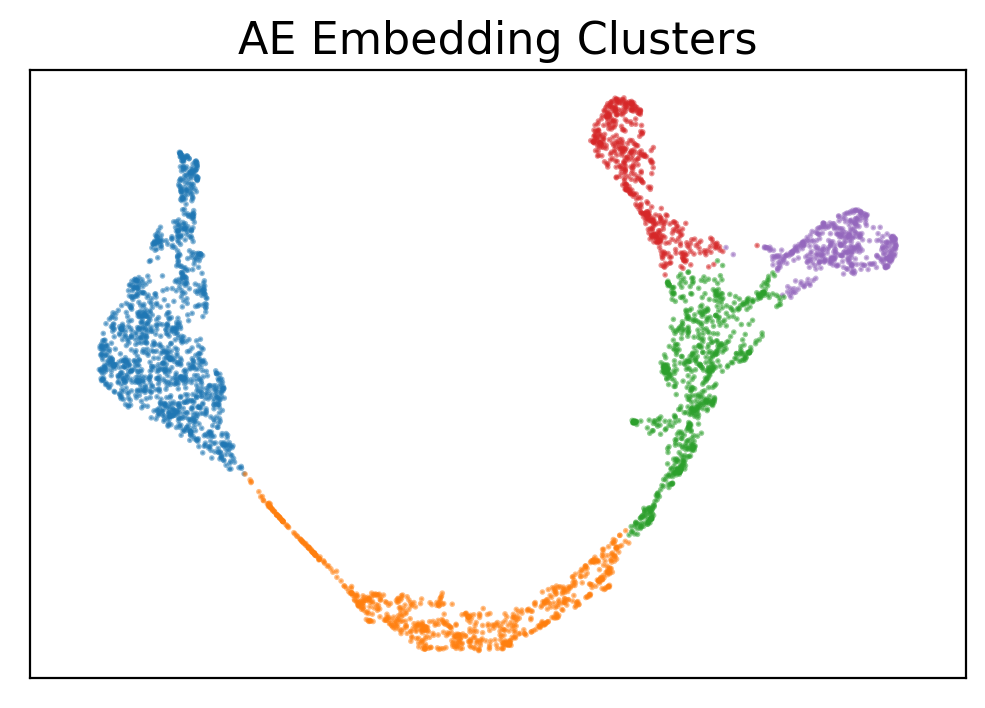

In [102]:
plt.figure()
plt.scatter(vae_embedding_umap[:, 0], 
            vae_embedding_umap[:, 1], 
            c=[tab10_colors(i) for i in adata.obs["leiden"].cat.codes.to_numpy()],
            s=1, 
            alpha=0.5)
# plt.scatter(vae_embedding_progress_umap[:, 0], 
#             vae_embedding_progress_umap[:, 1], 
#             c=np.arange(vae_embedding_progress_umap.shape[0]), 
#             cmap="viridis",
#             s=20
#            )
# plt.colorbar()
# plt.scatter(vae_embedding_progress_umap[0, 0], vae_embedding_progress_umap[0, 1], s=20, color="red")
plt.gca().set_aspect('equal', 'datalim')
plt.title('AE Embedding Clusters', fontsize=16)
plt.xticks([]),plt.yticks([])
plt.savefig("ae-cluster-color.pdf")
plt.show()

In [33]:
scv.tl.velocity(adata, mode='dynamical', use_raw=False)
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(adata, var_names=top_genes, groupby='leiden')

computing velocities
    finished (0:00:04) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
testing for differential kinetics
    finished (0:00:12) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


saving figure to file ./figures/scvelo_diff_kinetic_testing.pdf


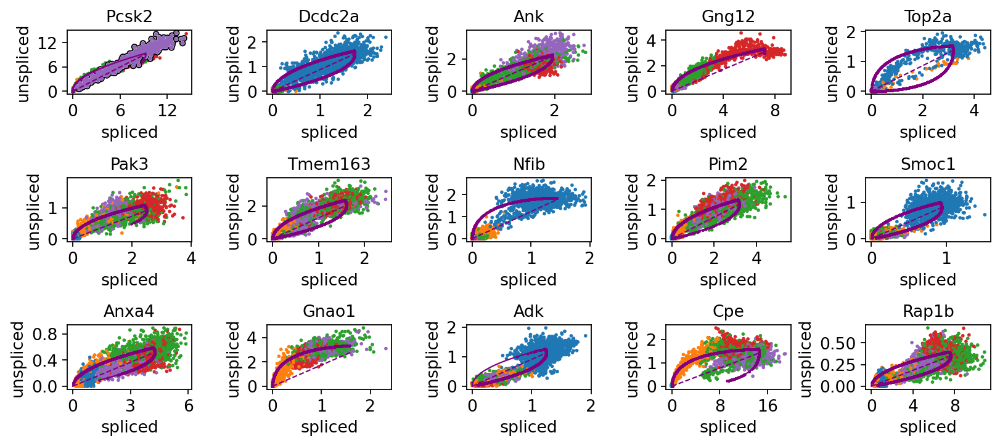

In [112]:
scv.settings.presenter_view = True
scv.pl.scatter(adata, basis=top_genes[:15], 
               ncols=5, add_outline='fit_diff_kinetics', 
               wspace=0.6, hspace=1.3, 
               save="diff_kinetic_testing")

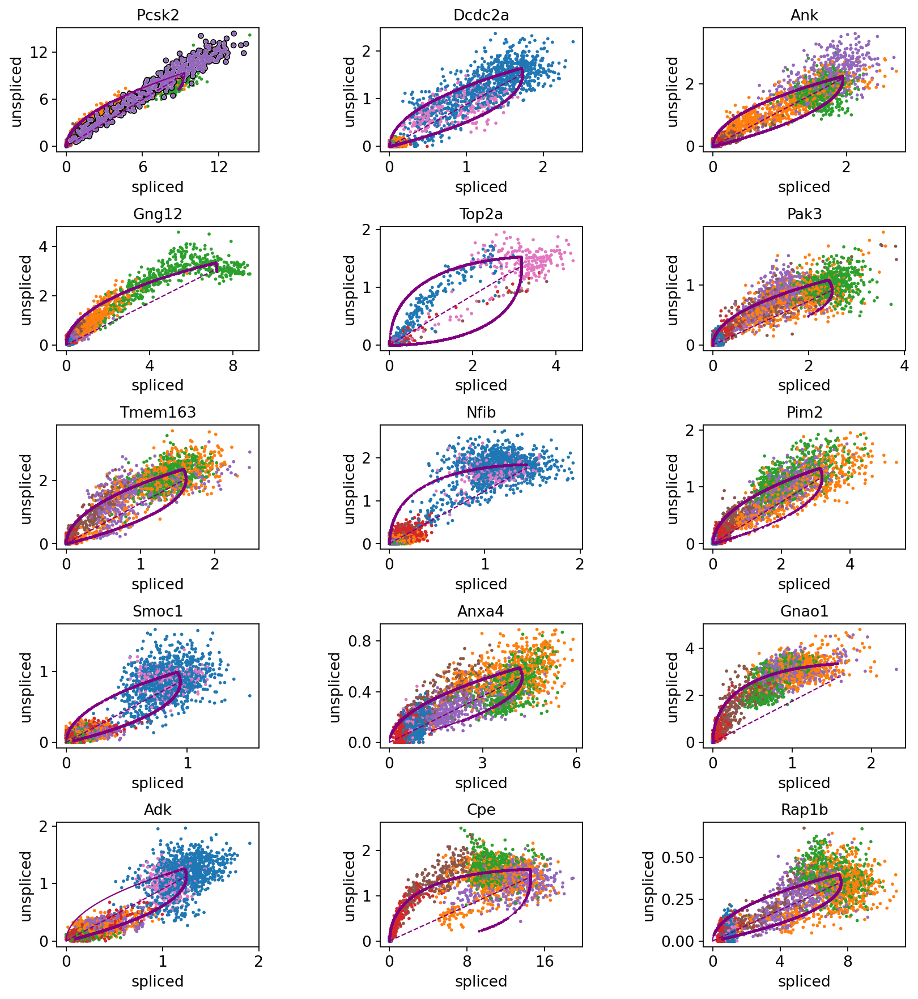

In [42]:
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo') 
scv.pl.scatter(adata, basis=top_genes[:15], ncols=3, add_outline='fit_diff_kinetics', wspace=0.6, hspace=0.6)